In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('./data/stud.csv')

In [3]:
df.head()

,gender,race_ethnicity,parental_level_of_education,lunch,test_preparation_course,math_score,reading_score,writing_score
0,female,group B,bachelor's degree,standard,none,72,72,74
1,female,group C,some college,standard,completed,69,90,88
2,female,group B,master's degree,standard,none,90,95,93
3,male,group A,associate's degree,free/reduced,none,47,57,44
4,male,group C,some college,standard,none,76,78,75


In [4]:
df.shape

(1000, 8)

- gender : sex of students  -> (Male/female)
- race/ethnicity : ethnicity of students -> (Group A, B,C, D,E)
- parental level of education : parents' final education ->(bachelor's degree,some college,master's degree,associate's degree,high school)
- lunch : having lunch before test (standard or free/reduced) 
- test preparation course : complete or not complete before test
- math score
- reading score
- writing score

### 3. Data Checks to perform

- Check Missing values
- Check Duplicates
- Check data type
- Check the number of unique values of each column
- Check statistics of data set
- Check various categories present in the different categorical column

## Checking missing values

In [5]:
df.isna().sum()

gender                         0
race_ethnicity                 0
parental_level_of_education    0
lunch                          0
test_preparation_course        0
math_score                     0
reading_score                  0
writing_score                  0
dtype: int64

No missing values

## Checking duplicates

In [6]:
df.duplicated().sum()

0

No duplicate values

## Check data types

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 8 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   gender                       1000 non-null   object
 1   race_ethnicity               1000 non-null   object
 2   parental_level_of_education  1000 non-null   object
 3   lunch                        1000 non-null   object
 4   test_preparation_course      1000 non-null   object
 5   math_score                   1000 non-null   int64 
 6   reading_score                1000 non-null   int64 
 7   writing_score                1000 non-null   int64 
dtypes: int64(3), object(5)
memory usage: 62.6+ KB


In [8]:
df.nunique()

gender                          2
race_ethnicity                  5
parental_level_of_education     6
lunch                           2
test_preparation_course         2
math_score                     81
reading_score                  72
writing_score                  77
dtype: int64

## Check stats of data

In [9]:
df.describe()

,math_score,reading_score,writing_score
count,1000.00000,1000.000000,1000.000000
mean,66.08900,69.169000,68.054000
std,15.16308,14.600192,15.195657
min,0.00000,17.000000,10.000000
25%,57.00000,59.000000,57.750000
50%,66.00000,70.000000,69.000000
75%,77.00000,79.000000,79.000000
max,100.00000,100.000000,100.000000


In [10]:
df.head()

,gender,race_ethnicity,parental_level_of_education,lunch,test_preparation_course,math_score,reading_score,writing_score
0,female,group B,bachelor's degree,standard,none,72,72,74
1,female,group C,some college,standard,completed,69,90,88
2,female,group B,master's degree,standard,none,90,95,93
3,male,group A,associate's degree,free/reduced,none,47,57,44
4,male,group C,some college,standard,none,76,78,75


In [11]:
print(f"Catgories in gender:{df['gender'].unique()}\n")
print(f"Catgories in ethnicity:{df['race_ethnicity'].unique()}\n")
print(f"Catgories in parental_level_of_education:{df['parental_level_of_education'].unique()}\n")
print(f"Catgories in lunch:{df['lunch'].unique()}\n")
print(f"Catgories in test_preparation_course:{df['test_preparation_course'].unique()}\n")

Catgories in gender:['female' 'male']

Catgories in ethnicity:['group B' 'group C' 'group A' 'group D' 'group E']

Catgories in parental_level_of_education:["bachelor's degree" 'some college' "master's degree" "associate's degree"
 'high school' 'some high school']

Catgories in lunch:['standard' 'free/reduced']

Catgories in test_preparation_course:['none' 'completed']



In [12]:
#define numerical and categrical features
num_feat = [feature for feature in df.columns if df[feature].dtype!='O']
cat_feat = [feature for feature in df.columns if df[feature].dtype=='O']

print(f"There are {len(num_feat)} feature in numeric features: {num_feat}\n")
print(f"There are {len(cat_feat)} feature in numeric features: {cat_feat}\n")

There are 3 feature in numeric features: ['math_score', 'reading_score', 'writing_score']

There are 5 feature in numeric features: ['gender', 'race_ethnicity', 'parental_level_of_education', 'lunch', 'test_preparation_course']



## Adding total score and average score 

In [13]:
df['tot_score'] = df['math_score'] +df['reading_score']+df['writing_score']
df['average'] = df["tot_score"]/3
df.head()

,gender,race_ethnicity,parental_level_of_education,lunch,test_preparation_course,math_score,reading_score,writing_score,tot_score,average
0,female,group B,bachelor's degree,standard,none,72,72,74,218,72.666667
1,female,group C,some college,standard,completed,69,90,88,247,82.333333
2,female,group B,master's degree,standard,none,90,95,93,278,92.666667
3,male,group A,associate's degree,free/reduced,none,47,57,44,148,49.333333
4,male,group C,some college,standard,none,76,78,75,229,76.333333


In [14]:
reading_full = df[df['reading_score']==100]['average'].count()
math_full = df[df['math_score']==100]['average'].count()
writing_full = df[df['writing_score']==100]['average'].count()

print(f'number of students with full reading marks: {reading_full}')
print(f'number of students with full math marks: {math_full}')
print(f'number of students with full writing marks: {writing_full}')

number of students with full reading marks: 17
number of students with full math marks: 7
number of students with full writing marks: 14


In [15]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']=400

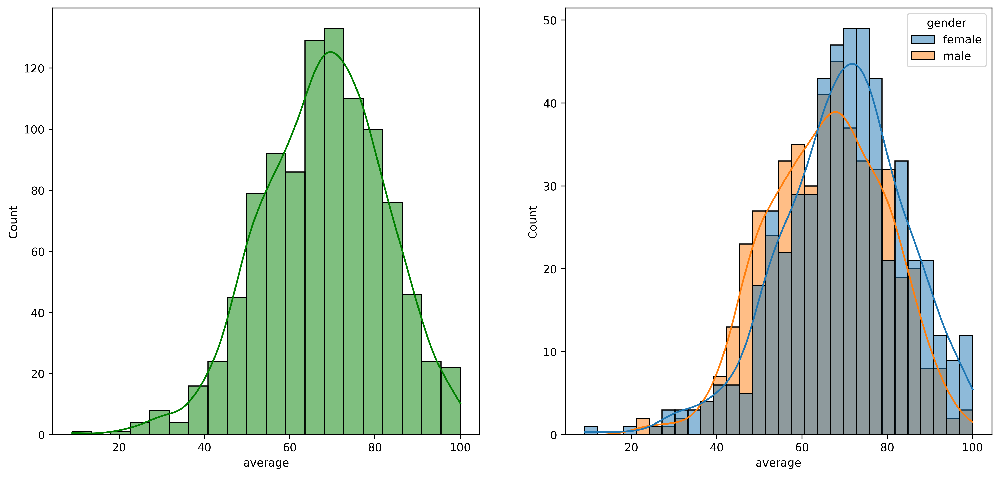

In [16]:
fig,axs = plt.subplots(1,2,figsize=(15,7))
plt.subplot(121)
sns.histplot(data=df,x='average',bins=20,kde=True,color='g')
plt.subplot(122)
sns.histplot(data=df,x='average',bins=30,kde=True,hue='gender')
plt.show()

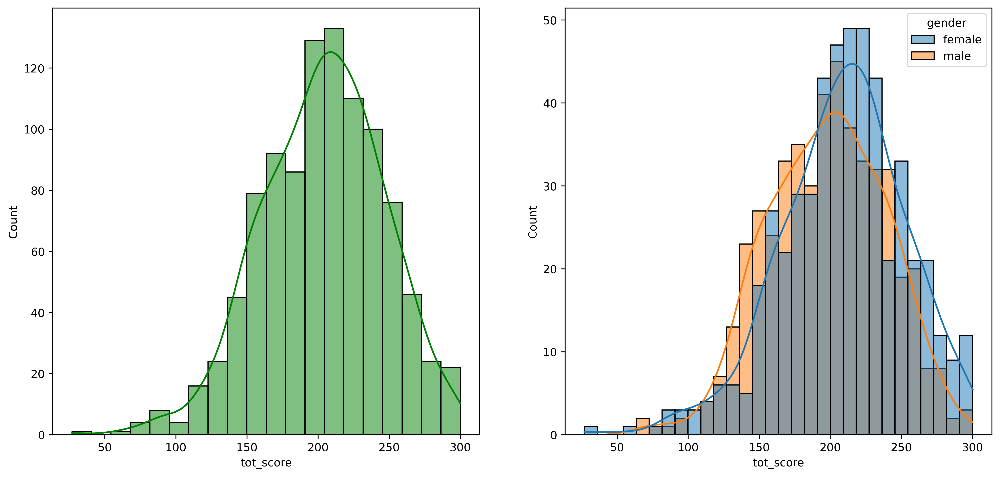

In [17]:
fig,axs = plt.subplots(1,2,figsize=(15,7))
plt.subplot(121)
sns.histplot(data=df,x='tot_score',bins=20,kde=True,color='g')
plt.subplot(122)
sns.histplot(data=df,x='tot_score',bins=30,kde=True,hue='gender')
plt.show()

### Insights
female students perform better than male

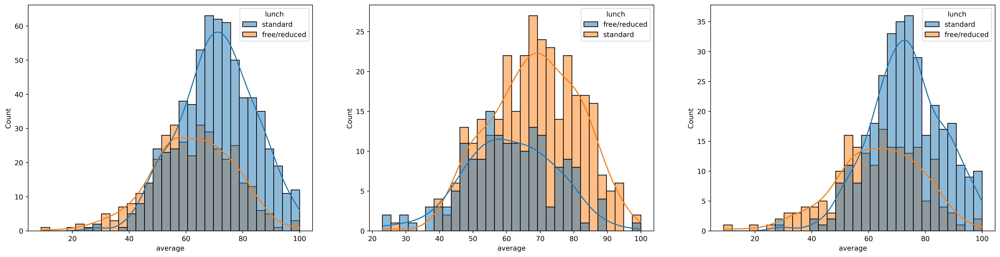

In [18]:
plt.subplots(1,3,figsize=(25,6))
plt.subplot(131)
sns.histplot(data=df,x='average',bins=30,kde=True,hue='lunch')
plt.subplot(132)
sns.histplot(data=df[df.gender=='male'],x='average',bins=30,kde=True,hue='lunch')
plt.subplot(133)
sns.histplot(data=df[df.gender=='female'],x='average',bins=30,kde=True,hue='lunch')
plt.show()

### Insights
Standard lunch is better for exams irrespective of their genders

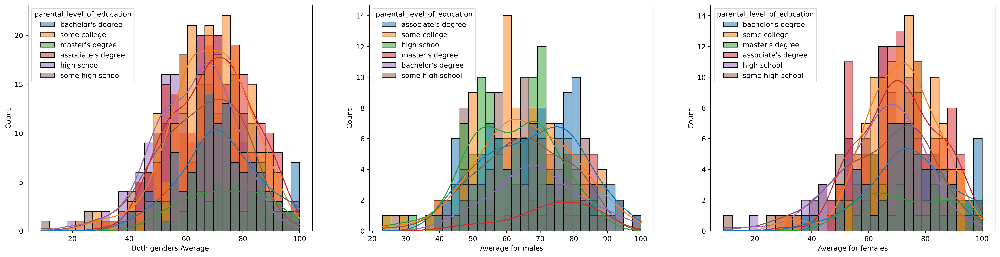

In [19]:
plt.subplots(1,3,figsize=(25,6))
plt.subplot(131)
sns.histplot(data=df,x='average',bins=30,kde=True,hue='parental_level_of_education')
plt.xlabel('Both genders Average')
plt.subplot(132)
sns.histplot(data=df[df.gender=='male'],x='average',bins=30,kde=True,hue='parental_level_of_education')
plt.xlabel('Average for males')
plt.subplot(133)
sns.histplot(data=df[df.gender=='female'],x='average',bins=30,kde=True,hue='parental_level_of_education')
plt.xlabel('Average for females')
plt.show()

### Insights
- In general parent's education don't help student perform well in exam.
- 2nd plot shows that parent's whose education is of associate's degree or master's degree their male child tend to perform well in exam
- 3rd plot we can see there is no effect of parent's education on female students.

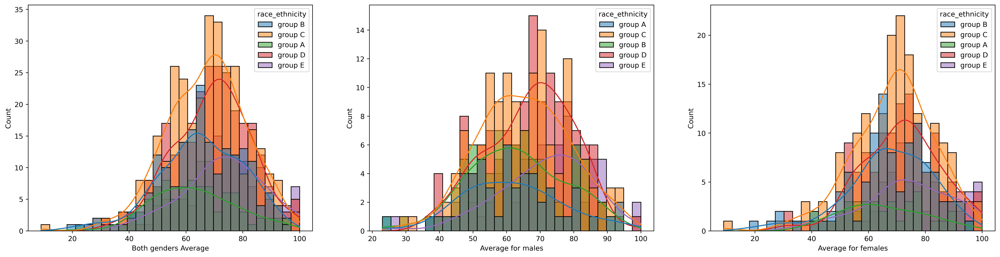

In [20]:
plt.subplots(1,3,figsize=(25,6))
plt.subplot(131)
sns.histplot(data=df,x='average',bins=30,kde=True,hue='race_ethnicity')
plt.xlabel('Both genders Average')
plt.subplot(132)
sns.histplot(data=df[df.gender=='male'],x='average',bins=30,kde=True,hue='race_ethnicity')
plt.xlabel('Average for males')
plt.subplot(133)
sns.histplot(data=df[df.gender=='female'],x='average',bins=30,kde=True,hue='race_ethnicity')
plt.xlabel('Average for females')
plt.show()

###  Insights
- Students of group A and group B tends to perform poorly in exam.
- Students of group A and group B tends to perform poorly in exam irrespective of whether they are male or female

<AxesSubplot:title={'center':'READING SCORES'}, ylabel='reading_score'>

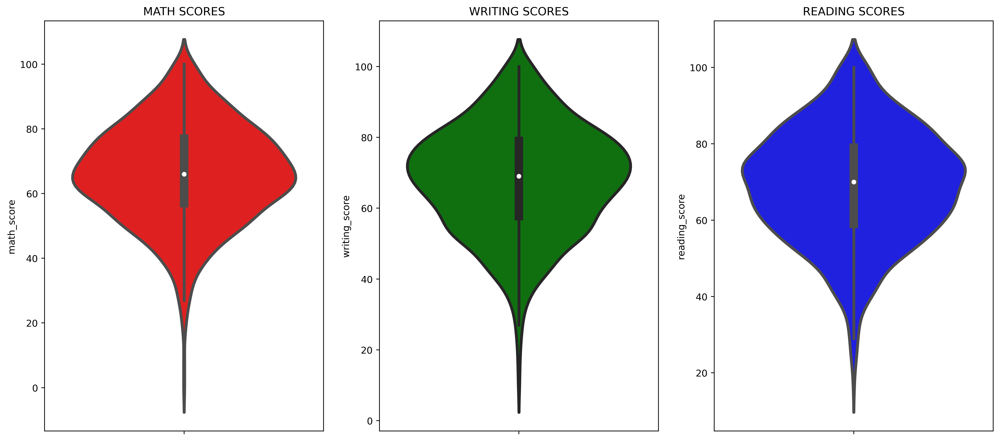

In [21]:
plt.figure(figsize=(18,8))
plt.subplot(131)
plt.title('MATH SCORES')
sns.violinplot(y='math_score',data=df,color='red',linewidth=3)
plt.subplot(132)
plt.title('WRITING SCORES')
sns.violinplot(y='writing_score',data=df,color='green',linewidth=3)
plt.subplot(133)
plt.title('READING SCORES')
sns.violinplot(y='reading_score',data=df,color='blue',linewidth=3)

### Insights
- From the above three plots its clearly visible that most of the students score in between 60-80 in Maths whereas in reading and writing most of them score from 50-80

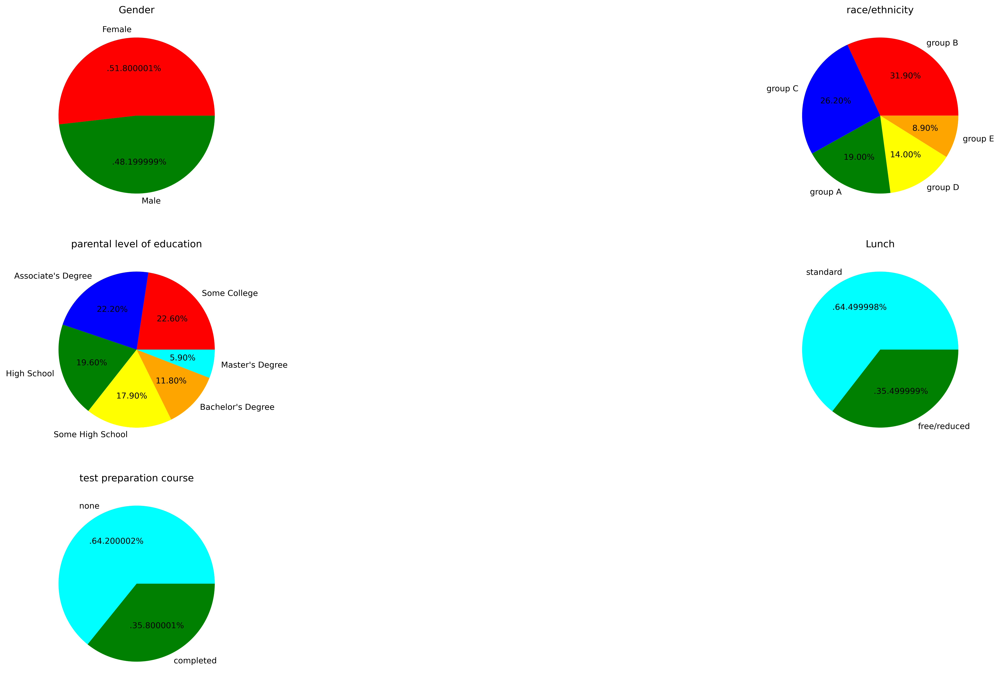

In [22]:
plt.rcParams['figure.figsize']=(30,15)

plt.subplot(3,2,1)
size= df['gender'].value_counts()
labels='Female','Male'
color=['red','green']
plt.pie(size,colors=color,labels=labels,autopct='.%2f%%')
plt.title('Gender')
plt.axis('off')

plt.subplot(3,2,2)
size=df['race_ethnicity'].value_counts()
labels='group B','group C','group A','group D','group E'
color=['red','blue','green','yellow','orange']
plt.pie(size,labels=labels,colors=color,autopct='%.2f%%')
plt.title('race/ethnicity')
plt.axis('off')

plt.subplot(3,2,3)
size=df['parental_level_of_education'].value_counts()
labels='Some College', "Associate's Degree",'High School','Some High School',"Bachelor's Degree","Master's Degree"
color=['red','blue','green','yellow','orange','cyan']
plt.pie(size,labels=labels,colors=color,autopct='%.2f%%')
plt.title('parental level of education')
plt.axis('off')

plt.subplot(3,2,4)
size= df['lunch'].value_counts()
labels='standard','free/reduced'
color=['cyan','green']
plt.pie(size,colors=color,labels=labels,autopct='.%2f%%')
plt.title('Lunch')
plt.axis('off')

plt.subplot(3,2,5)
size= df['test_preparation_course'].value_counts()
labels='none','completed'
color=['cyan','green']
plt.pie(size,colors=color,labels=labels,autopct='.%2f%%')
plt.title('test preparation course')
plt.axis('off')
plt.show()

###  Insights
- Number of Male and Female students is almost equal
- Number students are greatest in Group C
- Number of students who have standard lunch are greater
- Number of students who have not enrolled in any test preparation course is greater
- Number of students whose parental education is "Some College" is greater followed closely by "Associate's Degree"

## UNIVARIATE ANALYSIS ( How is distribution of Gender ? )

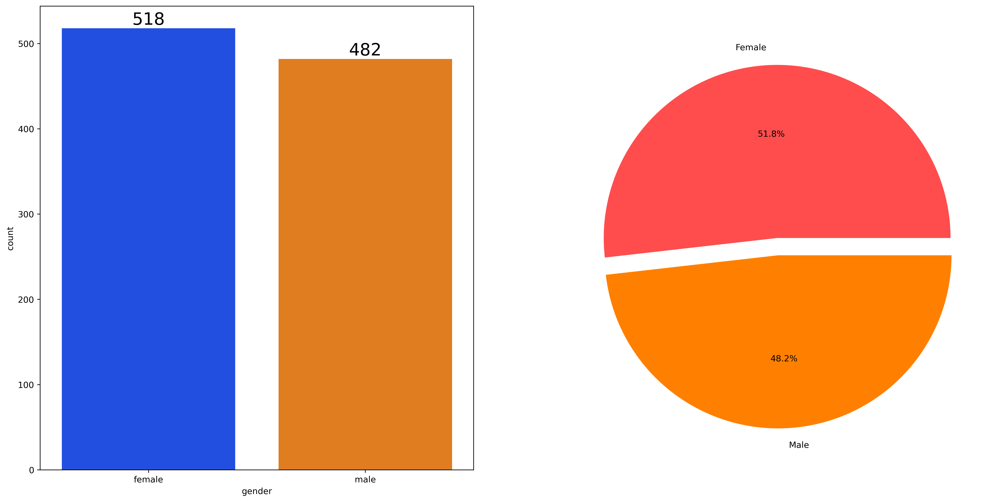

In [23]:
f,ax=plt.subplots(1,2,figsize=(20,10))
sns.countplot(x=df['gender'],data=df,palette='bright',ax=ax[0])
for container in ax[0].containers:
    ax[0].bar_label(container,color='black',size=20)
plt.pie(x=df['gender'].value_counts(),labels=['Female','Male'],explode=[0,0.1],autopct='%1.1f%%',colors=['#ff4d4d','#ff8000'])
plt.show()

### Insights
- gender has balanced data with 518(51.8%) females and rest males

## BIVARIATE ANALYSIS ( Does gender have any impact on student's performance ? ) 

In [24]:
gender_group=df.groupby('gender').mean()
gender_group

,math_score,reading_score,writing_score,tot_score,average
gender,,,,,
female,63.633205,72.608108,72.467181,208.708494,69.569498
male,68.728216,65.473029,63.311203,197.512448,65.837483


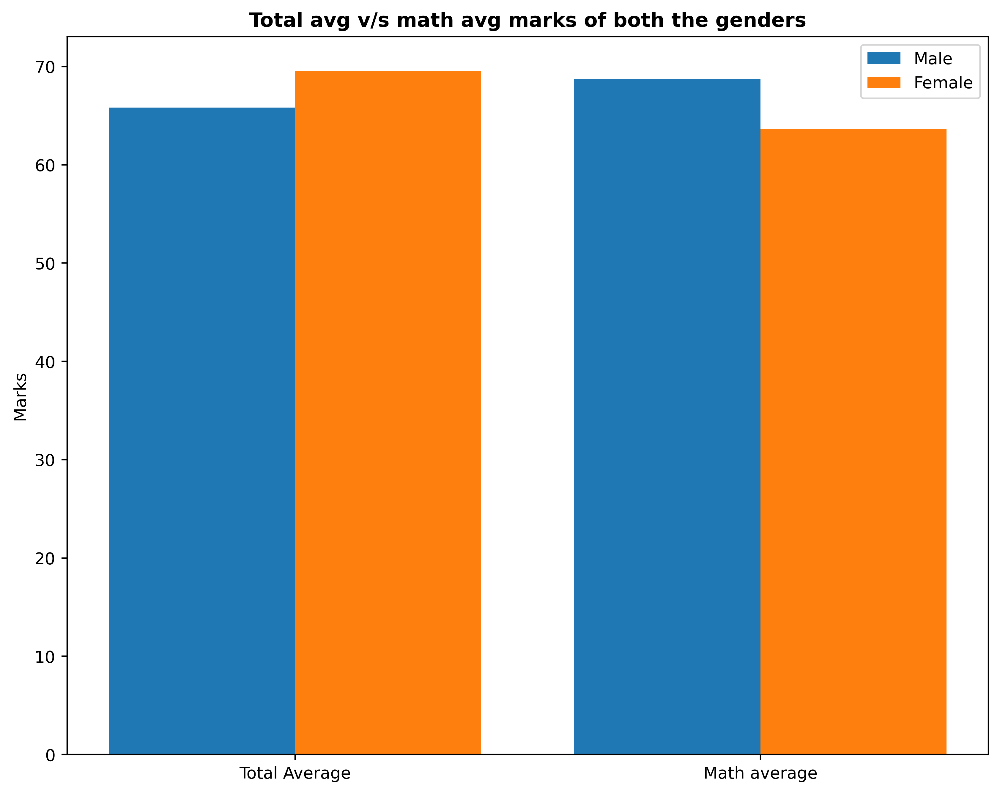

In [25]:
plt.figure(figsize=(10,8))

X=['Total Average', 'Math average']

female_scores=[gender_group['average'][0],gender_group['math_score'][0]]
male_scores=[gender_group['average'][1],gender_group['math_score'][1]]
X_axis=np.arange(len(X))

plt.bar(X_axis -0.2,male_scores,0.4,label='Male')
plt.bar(X_axis +0.2,female_scores,0.4,label='Female')

plt.xticks(X_axis,X)
plt.ylabel("Marks")
plt.title('Total avg v/s math avg marks of both the genders',fontweight='bold')
plt.legend()
plt.show()




## Insights 
- On an average females have a better overall score than men.
- whereas males have scored higher in Maths.

### Race/Ethnicity

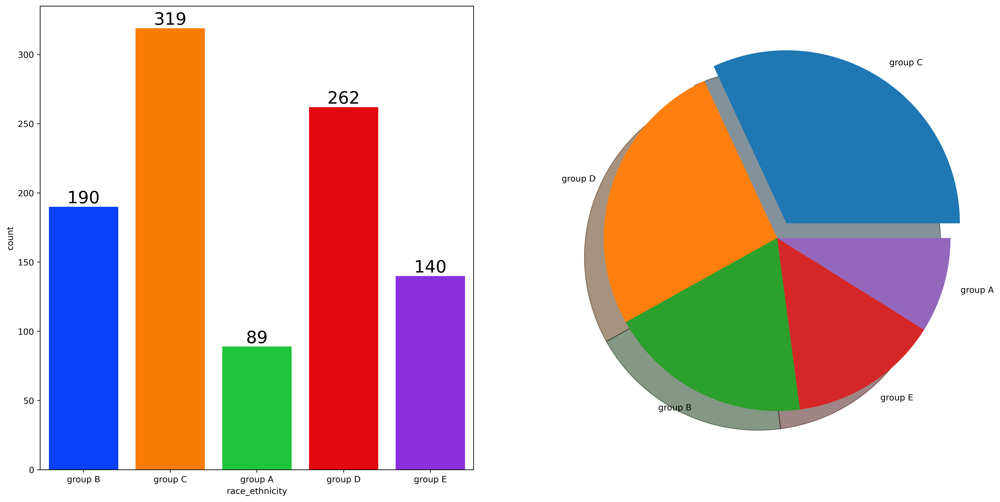

In [26]:
f,ax=plt.subplots(1,2,figsize=(20,10))

sns.countplot(data=df, x=df["race_ethnicity"],palette='bright',saturation=0.95,ax=ax[0])
for container in ax[0].containers:
    ax[0].bar_label(container,color='black',size=20)
    
plt.pie(data=df,x=df['race_ethnicity'].value_counts(),labels=df['race_ethnicity'].value_counts().index,explode=[0.1,0,0,0,0],shadow=True)
plt.show()

### Insights 
- Most of the student belonging from group C /group D.
- Lowest number of students belong to groupA.

## BIVARIATE ANALYSIS ( Is Race/Ehnicity has any impact on student's performance ? )

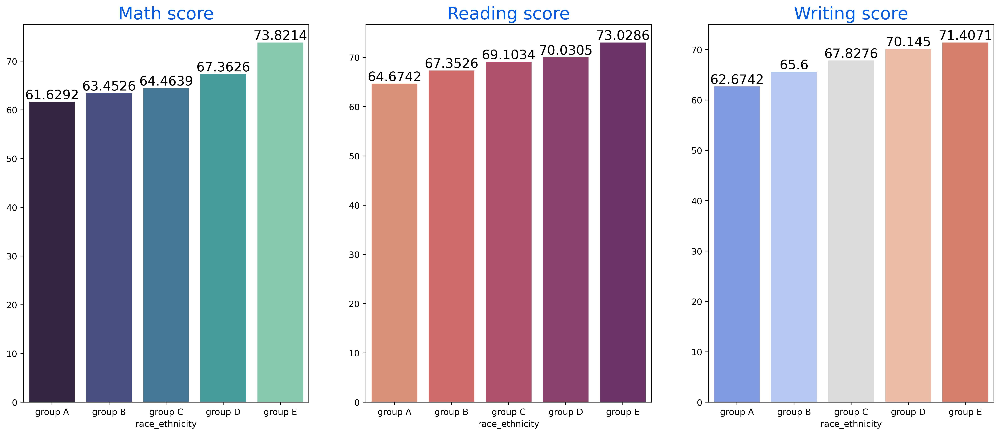

In [27]:
Group_data2=df.groupby('race_ethnicity')
f,ax=plt.subplots(1,3,figsize=(20,8))
sns.barplot(x=Group_data2['math_score'].mean().index,y=Group_data2['math_score'].mean().values,palette = 'mako',ax=ax[0])
ax[0].set_title('Math score',color='#005ce6',size=20)

for container in ax[0].containers:
    ax[0].bar_label(container,color='black',size=15)

sns.barplot(x=Group_data2['reading_score'].mean().index,y=Group_data2['reading_score'].mean().values,palette = 'flare',ax=ax[1])
ax[1].set_title('Reading score',color='#005ce6',size=20)

for container in ax[1].containers:
    ax[1].bar_label(container,color='black',size=15)

sns.barplot(x=Group_data2['writing_score'].mean().index,y=Group_data2['writing_score'].mean().values,palette = 'coolwarm',ax=ax[2])
ax[2].set_title('Writing score',color='#005ce6',size=20)

for container in ax[2].containers:
    ax[2].bar_label(container,color='black',size=15)

### Insights 
- Group E students have scored the highest marks. 
- Group A students have scored the lowest marks. 
- Students from a lower Socioeconomic status have a lower avg in all course subjects

## PARENTAL LEVEL OF EDUCATION COLUMN
- What is educational background of student's parent ?
- Is parental education has any impact on student's performance ?

### UNIVARIATE ANALYSIS ( What is educational background of student's parent ? )

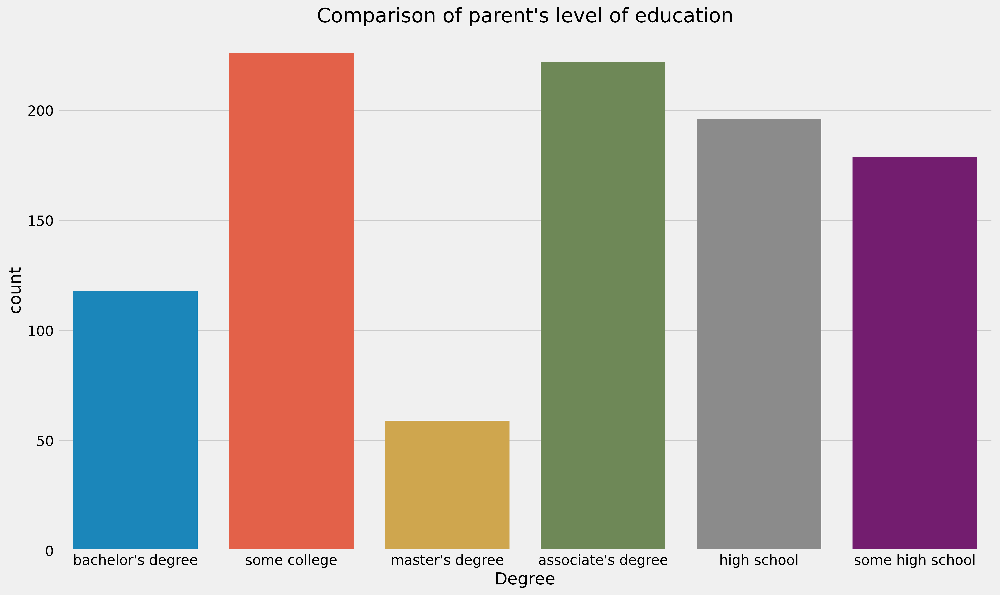

In [28]:
plt.rcParams['figure.figsize']=(15,9)
plt.style.use('fivethirtyeight')
sns.countplot(df['parental_level_of_education'])
plt.title("Comparison of parent's level of education",fontweight=30,fontsize=20)
plt.xlabel('Degree')
plt.ylabel('count')
plt.show()


### Insights
- least no. of parents have master's degree
- Largest no. of parents are from some college

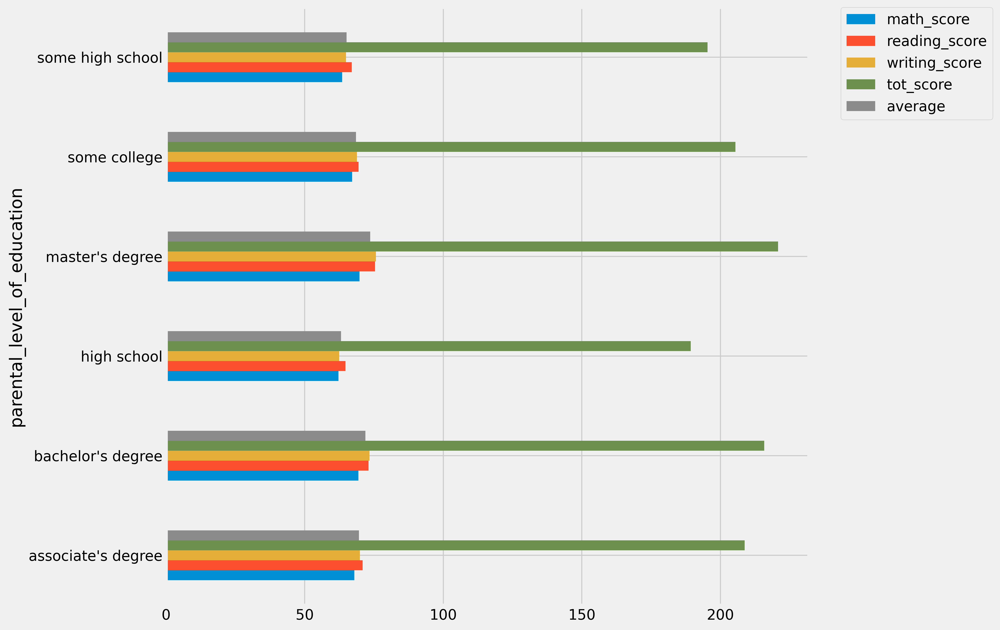

In [29]:
df.groupby('parental_level_of_education').agg('mean').plot(kind='barh', figsize=(10,10))
plt.legend(bbox_to_anchor=(1.05,1),loc=2,borderaxespad=0)
plt.show()

### Insights 
- The score of student whose parents possess master and bachelor level education are higher than others.

## 4.4.4 LUNCH COLUMN 
- Which type of lunch is most common amoung students ?
- What is the effect of lunch type on test results?


### UNIVARIATE ANALYSIS ( Which type of lunch is most common amoung students ? )

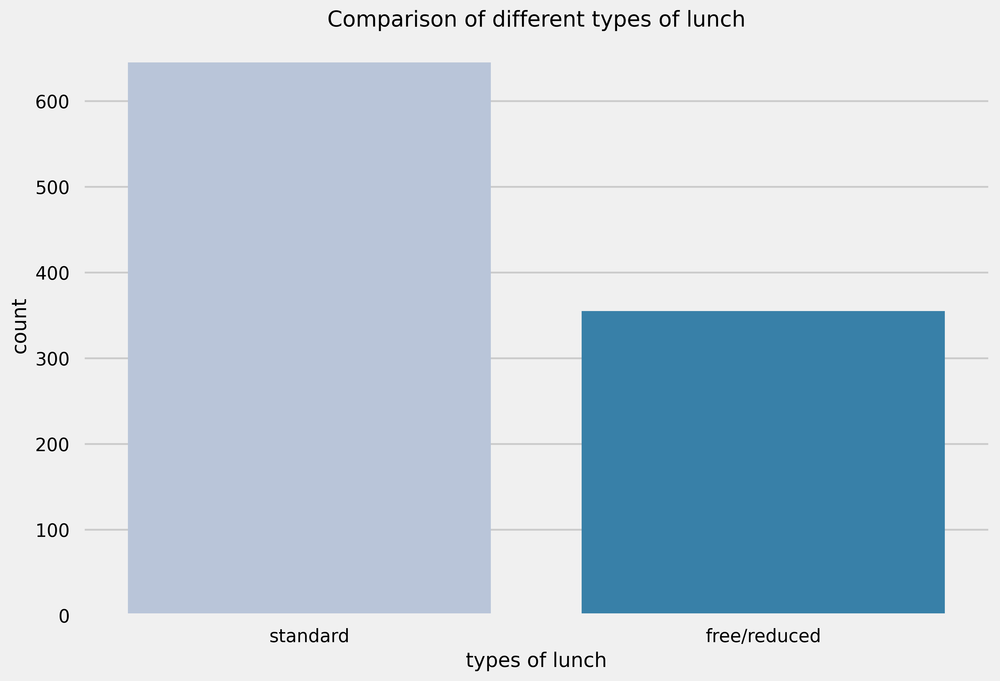

In [30]:
plt.rcParams['figure.figsize'] = (15, 9)
plt.style.use('seaborn-talk')
sns.countplot(df['lunch'],palette='PuBu')
plt.title('Comparison of different types of lunch')
plt.xlabel('types of lunch')
plt.ylabel('count')
plt.show()

### Insights
- students served standard lunch are more

In [31]:
df.head()

,gender,race_ethnicity,parental_level_of_education,lunch,test_preparation_course,math_score,reading_score,writing_score,tot_score,average
0,female,group B,bachelor's degree,standard,none,72,72,74,218,72.666667
1,female,group C,some college,standard,completed,69,90,88,247,82.333333
2,female,group B,master's degree,standard,none,90,95,93,278,92.666667
3,male,group A,associate's degree,free/reduced,none,47,57,44,148,49.333333
4,male,group C,some college,standard,none,76,78,75,229,76.333333


### Bivariate analysis(lunch to scores)

<AxesSubplot:ylabel='lunch'>

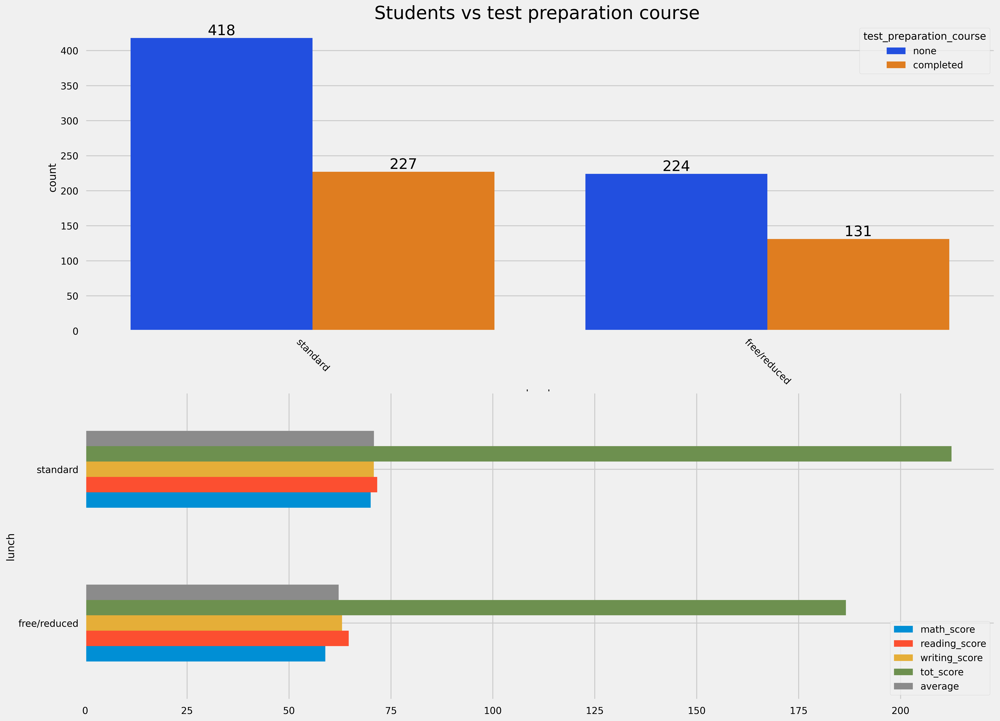

In [39]:
f,ax=plt.subplots(2,1,figsize=(20,16))
sns.countplot(x=df['lunch'],data=df,palette='bright',hue='test_preparation_course',ax=ax[0])
ax[0].tick_params(axis='x', rotation=-45)
ax[0].set_title('Students vs test preparation course ',color='black',size=25)
for container in ax[0].containers:
    ax[0].bar_label(container,color='black',size=20)
df.groupby('lunch').agg('mean').plot(kind='barh',ax=ax[1])

### Insights
- students with standard lunch perform better

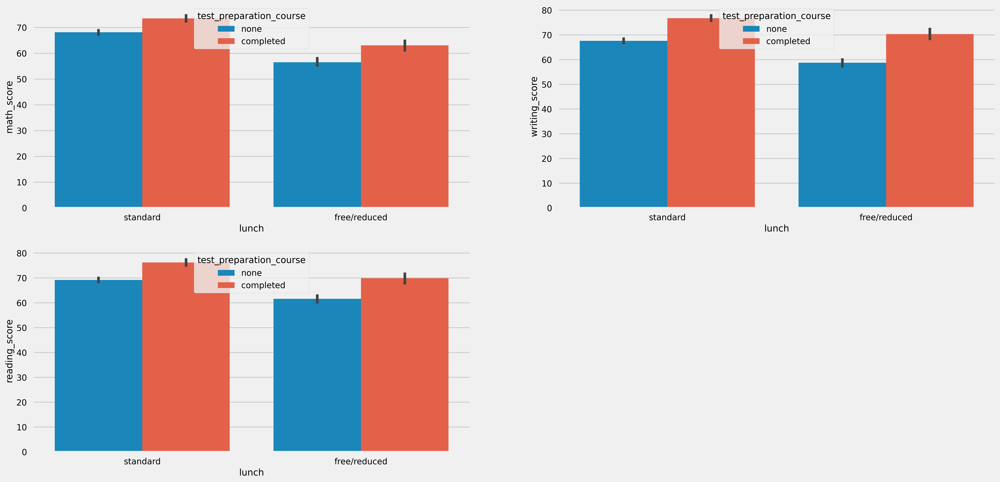

In [43]:
plt.figure(figsize=(24,12))

plt.subplot(2,2,1)
sns.barplot(x=df['lunch'],y=df['math_score'],hue=df['test_preparation_course'])

plt.subplot(2,2,2)
sns.barplot(x=df['lunch'],y=df['writing_score'],hue=df['test_preparation_course'])

plt.subplot(2,2,3)
sns.barplot(x=df['lunch'],y=df['reading_score'],hue=df['test_preparation_course'])
plt.show()


### Insights
- students with standard lunch who have completed their prep course have scored higher in all categories

# Checking Outliers

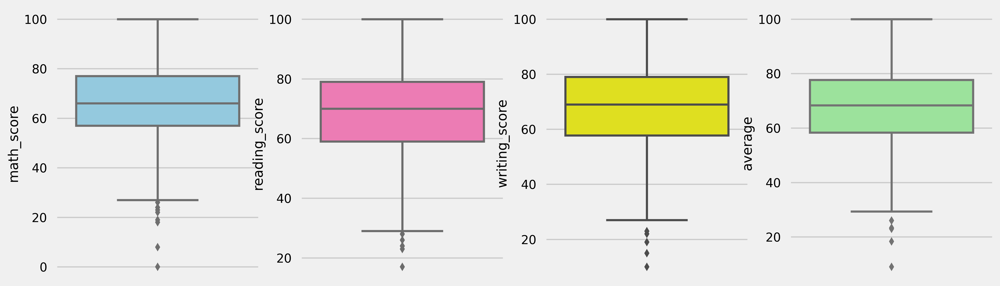

In [52]:
plt.subplots(1,4,figsize=(16,5))
plt.subplot(141)
sns.boxplot(y=df['math_score'],color='skyblue')
plt.subplot(142)
sns.boxplot(y=df['reading_score'],color='hotpink')
plt.subplot(143)
sns.boxplot(y=df['writing_score'],color='yellow')
plt.subplot(144)
sns.boxplot(y=df['average'],color='lightgreen')
plt.show()

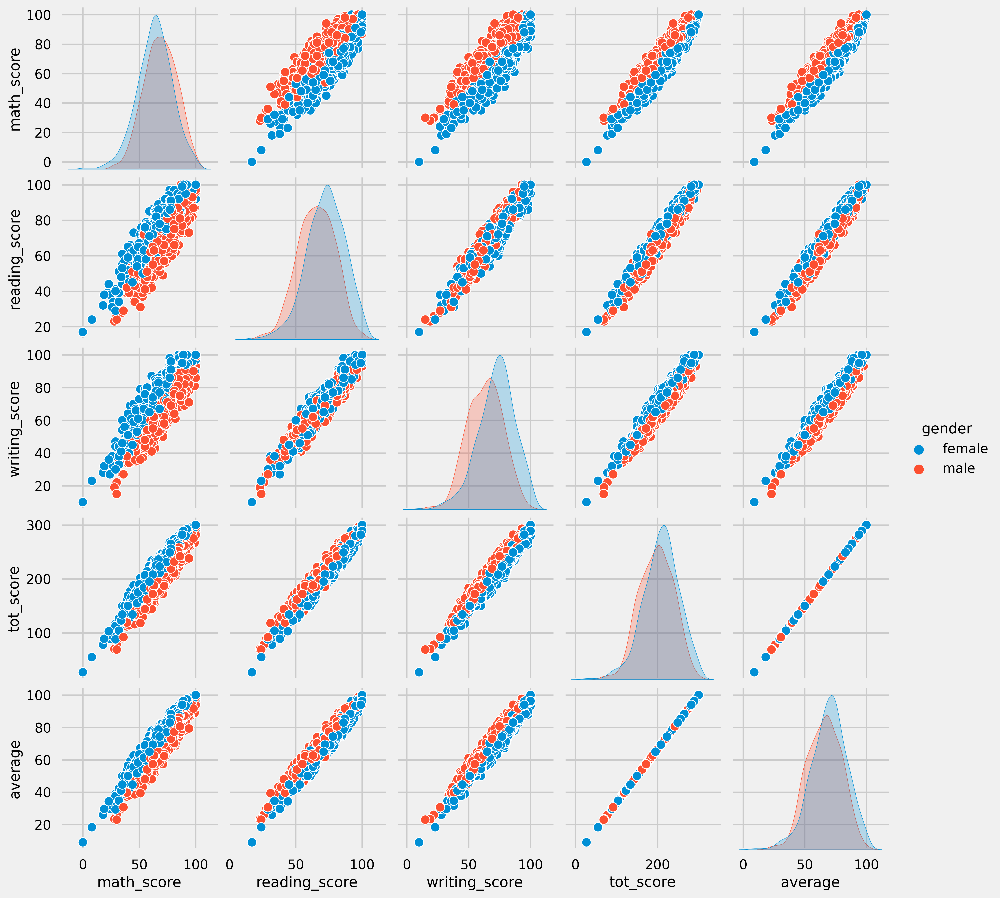

In [53]:
sns.pairplot(df,hue='gender')
plt.show()

### Conclusions
- Student's Performance is related with lunch, race, parental level education
- Females lead in pass percentage and also are top-scorers
- Student's Performance is not much related with test preparation course
- Finishing preparation course is benefitial.